In [1]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import pyarrow
from datetime import datetime
import simulations, utilities
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.cm as cm
from matplotlib import rcParams
import itertools
pv=!{sys.executable} --version
print(pv[0],'numpy ==', np.__version__, 'pyarrow ==',pyarrow.__version__, 'seaborn == ', sns.__version__)

Python 3.9.7 numpy == 1.20.3 pyarrow == 7.0.0 seaborn ==  0.11.2


In [2]:
# options
pd.set_option('display.max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
mpl.rcParams['figure.dpi'] = 300
sns.set_style("ticks")
sns.set_palette("cubehelix")
font_scale = 3
sns.set_context("paper", font_scale=font_scale, rc={"lines.linewidth": 2, 'aspect':1})
# figure size in inches
#rcParams['figure.figsize'] = 11.7,8.27

In [25]:
def plot1(df, ci=None, concise=True, title = None, legend=True, hue=None, style=None, col=None):
    x= 'Economic Gini'
    sns.relplot(aspect=1.5, kind="line", x=x, y='Log Market Cap', col = col, style=style, hue=hue, ci=ci, data=df, legend=legend);
    x= 'Knowledge Gini'
    sns.relplot(aspect=1.5, kind="line", x=x, y='Log Market Cap', col = col, style=style, hue=hue, ci=ci, data=df, legend=legend);
    sns.relplot(aspect=1.5, kind="line", x=x, y='Economic Gini', col = col, style=style, hue=hue, ci=ci, data=df, legend=legend);        

In [26]:
def plot2(df, ci=None, concise=True, title = None, legend=True, hue=None, style=None, col=None):
    x= 'Economic Gini'
    sns.lmplot(aspect=1.5, x=x, y='Log Market Cap', col = col, ci=ci, data=df, legend=legend);
    x= 'Knowledge Gini'
    sns.lmplot(aspect=1.5, x=x, y='Log Market Cap', col = col, ci=ci, data=df, legend=legend);
    sns.lmplot(aspect=1.5, x=x, y='Economic Gini', col = col, ci=ci, data=df, legend=legend);        

In [17]:
def plot_agg(df, ci=None, concise=True, title = None, legend=True, hue=None, x = 'Knowledge Gini',  
              ys=[ 'Log Market Cap', 'Economic Gini',  ],  
             style=None, col='A'):
    n = len(ys)
    for i in range(n):
        ax=sns.relplot(aspect=1.5, kind="line", x=x, y=ys[i], col = col, style=style, hue=hue, ci=ci, data=df, legend=legend);#, ax=axs[i]);  

In [4]:
data = pd.read_parquet('simulations.SimulationNK_main_agg.parquet')
print(data.shape)
print(data.columns)
data.head()

(4200, 22)
Index(['Configuration', 'Run', 'A', 'K', 'N', 'Companies', 'Economic Gini',
       'Economic Median', 'Economic Q1', 'Economic Q3', 'Exploration Effort',
       'Exploration Norms', 'Initial Economic Stock', 'Knowledge Gini',
       'Knowledge Median', 'Knowledge Q1', 'Knowledge Q3', 'Market Capital',
       'Seed', 'Simulation Size', 'Simulation Time', 'Time Step'],
      dtype='object')


,Configuration,Run,A,K,N,Companies,Economic Gini,Economic Median,Economic Q1,Economic Q3,Exploration Effort,Exploration Norms,Initial Economic Stock,Knowledge Gini,Knowledge Median,Knowledge Q1,Knowledge Q3,Market Capital,Seed,Simulation Size,Simulation Time,Time Step
0,0,0,0.600,1,2,100,0.914,0.000,0.000,0.000,10,0.100,100,0.235,0.494,0.281,0.494,29284,0,100,50,50
1,0,1,0.600,1,2,100,0.946,0.000,0.000,0.000,10,0.100,100,0.253,0.295,0.239,0.611,946,1,100,50,50
2,0,2,0.600,1,2,100,0.845,0.000,0.000,3.000,10,0.100,100,0.244,0.518,0.233,0.671,361,2,100,50,50
3,0,3,0.600,1,2,100,0.861,0.000,0.000,1.750,10,0.100,100,0.153,0.505,0.399,0.813,55122,3,100,50,50
4,0,4,0.600,1,2,100,0.990,0.000,0.000,0.000,10,0.100,100,0.514,0.039,0.039,0.540,0,4,100,50,50


In [5]:
data['Log Market Cap'] = np.log(1+data['Market Capital'])

In [6]:
data.dtypes
# round each float64 column to 3 decimals
for col, dtype in data.dtypes.to_dict().items():
    if str(dtype) == 'float64':
        data[col] = np.round(data[col], decimals=3)

In [7]:
data1 = data[data['K']==1]
data2 = data[data['K']==3]
data3 = data[data['K']==6]

# Economic Gini is associated with decreased Market Cap (with a lot of varialbility)

# same for knowledge gini

# a small increase in knowledge gini leads to a bigger increase in economic gini

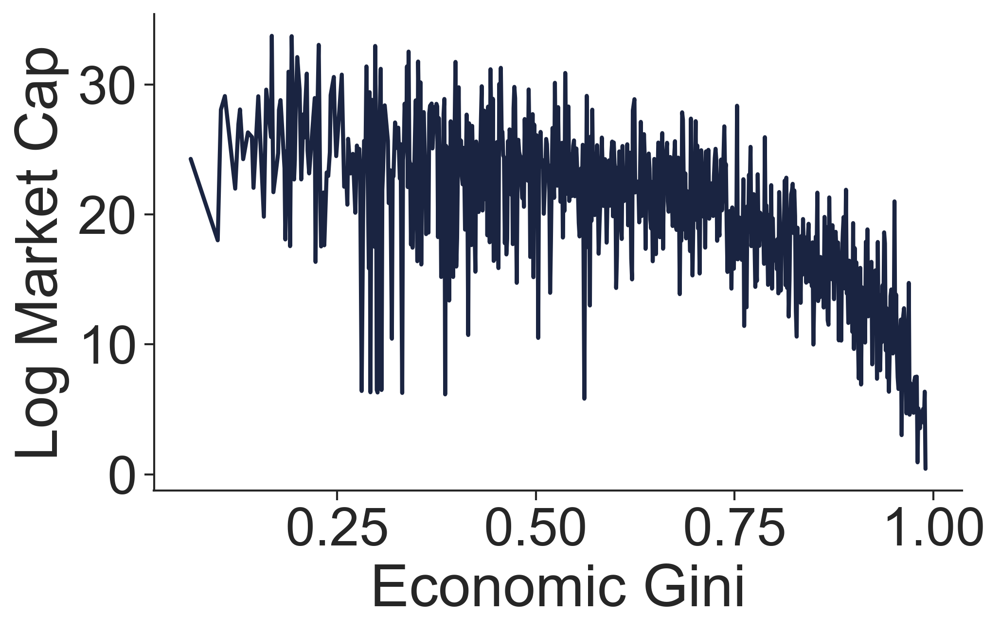

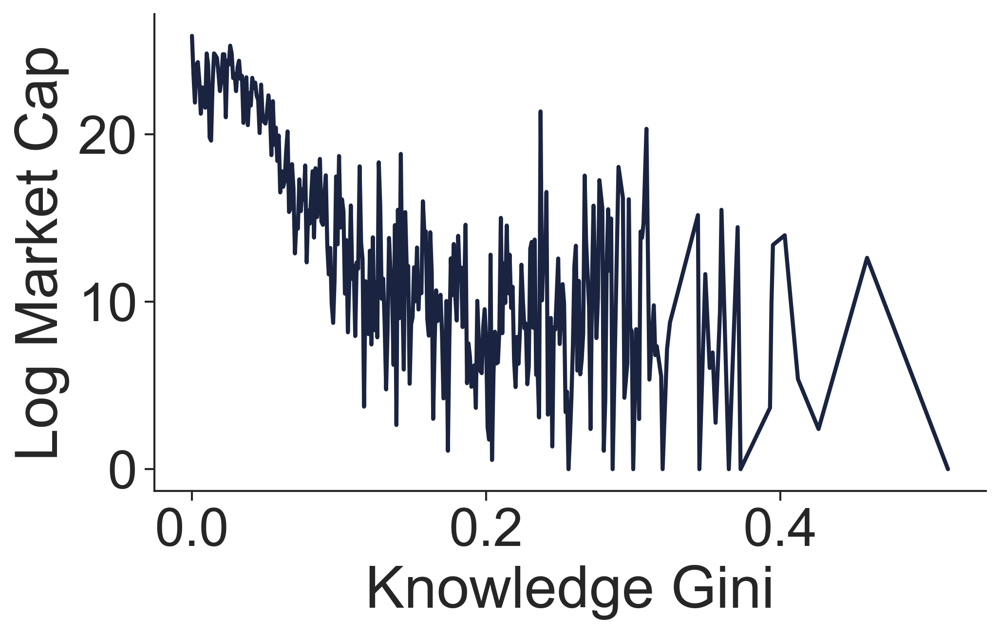

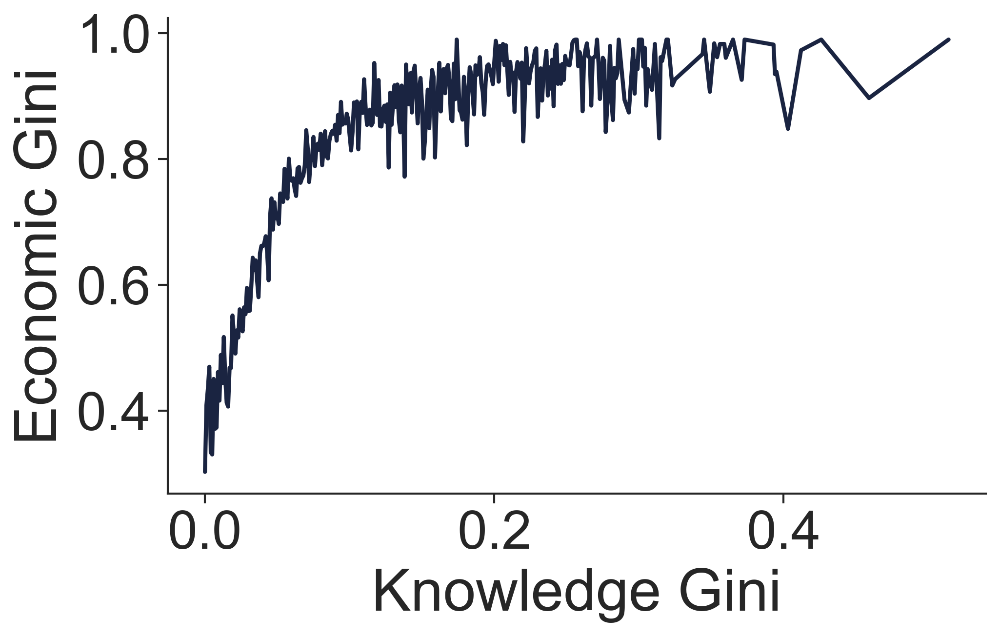

In [24]:
plot1(data, col=None)

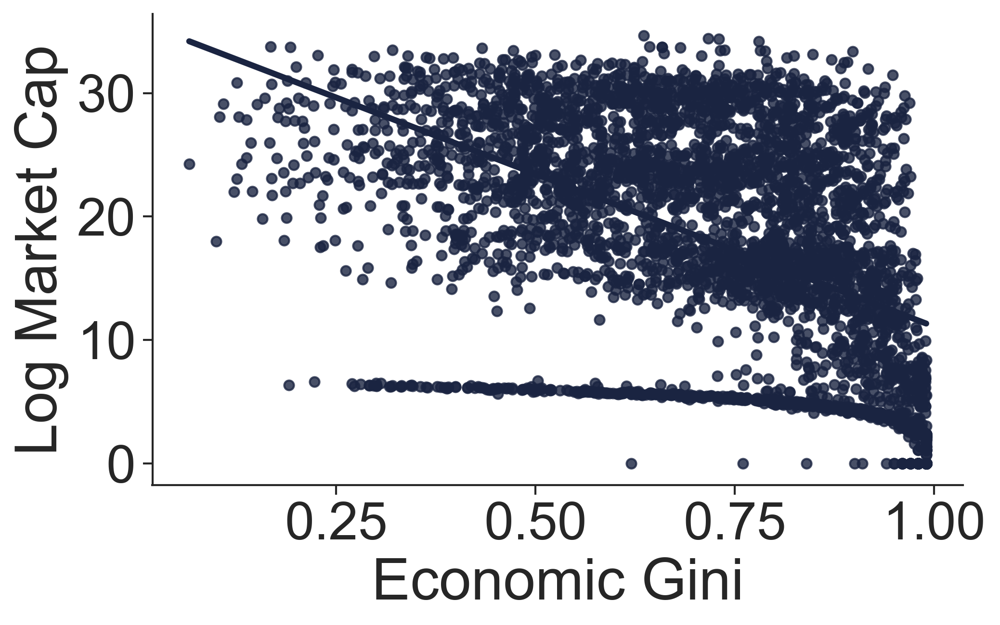

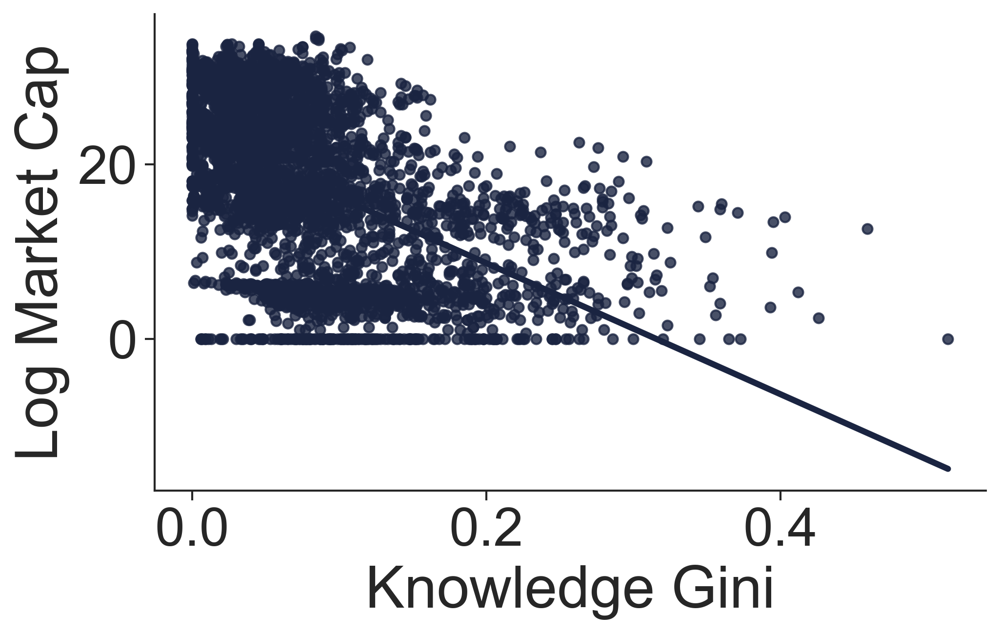

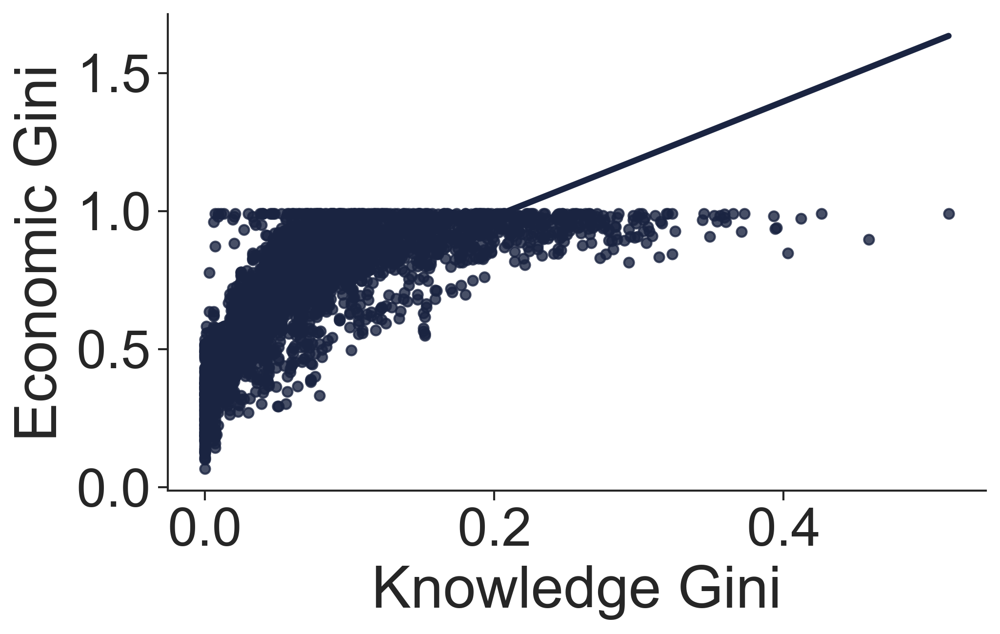

In [32]:
plot2(data)

# Examine the same as abvoe by A

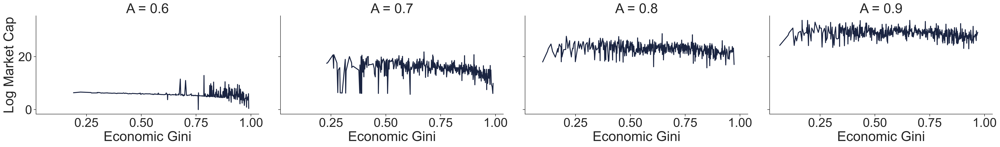

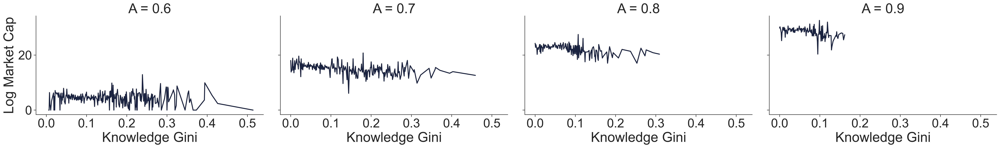

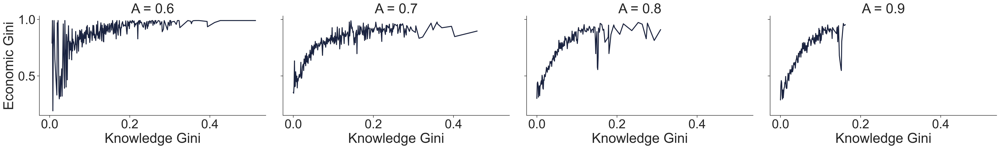

In [33]:
plot1(data, col='A')

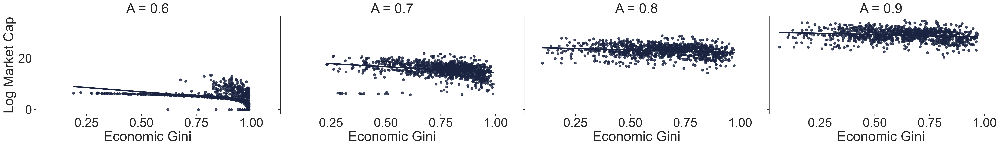

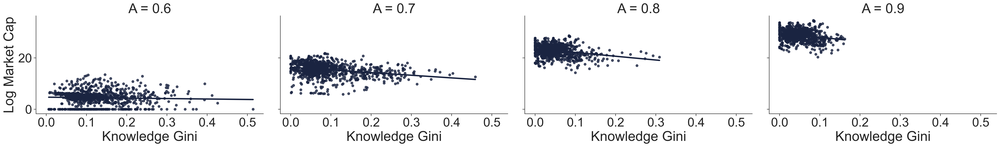

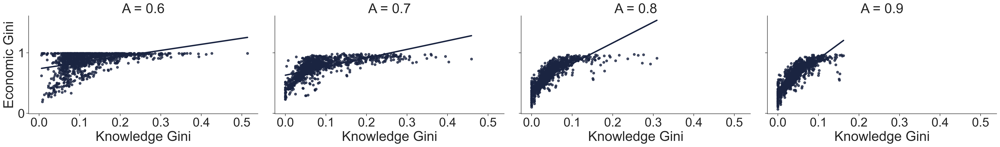

In [34]:
plot2(data, col='A')

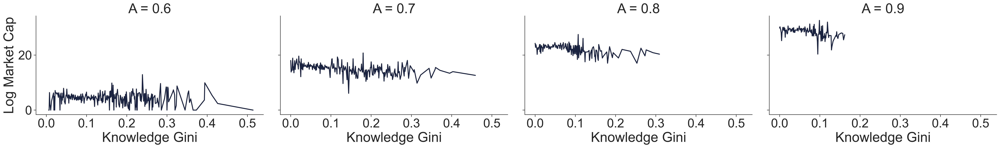

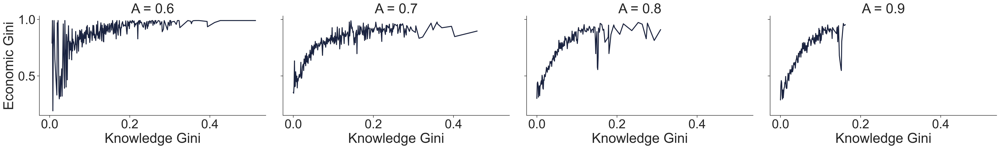

In [8]:
plot_agg(data)

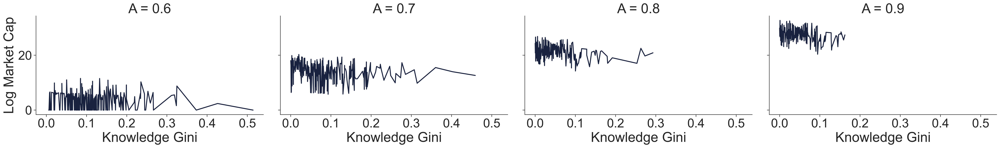

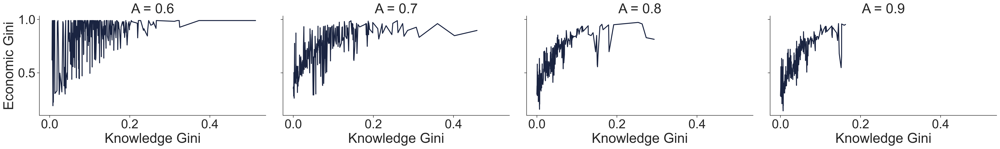

In [18]:
plot_agg(data1)

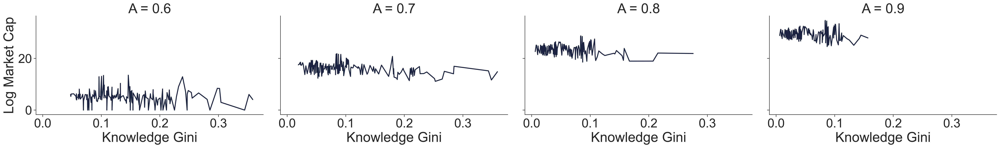

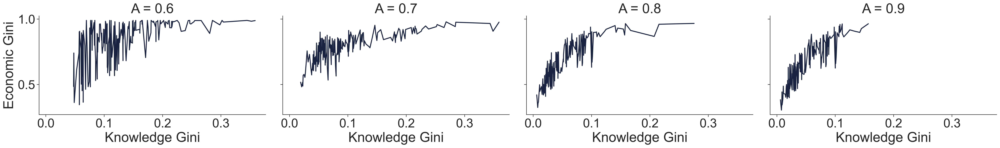

In [19]:
plot_agg(data2)

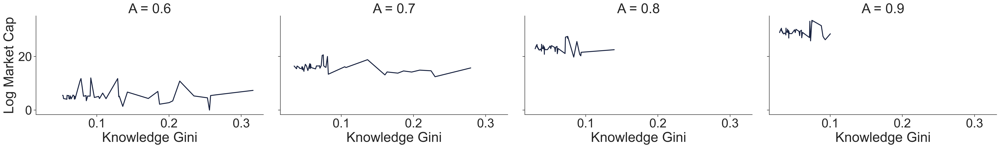

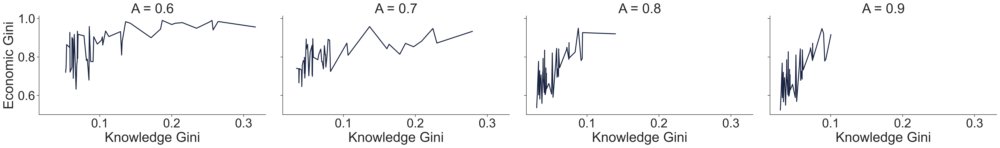

In [20]:
plot_agg(data3)

In [30]:
data.dtypes

A                         float64
K                           int64
N                           int64
Companies                   int64
Configuration               int64
Economic Gini             float64
Economic Median           float64
Economic Q1               float64
Economic Q3               float64
Exploration Effort          int64
Exploration Norms         float64
Initial Economic Stock      int64
Knowledge Gini            float64
Knowledge Median          float64
Knowledge Q1              float64
Knowledge Q3              float64
Run                         int64
Seed                        int64
Simulation Size             int64
Simulation Time             int64
Time Step                   int64
dtype: object